# TRABAJO FINAL


In [1]:
#Librerias
import pandas as pd
import numpy as np
import seaborn as sns
import chart_studio as py
import plotly.graph_objs as go 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn import metrics
import json
import matplotlib.pyplot as plt

## 1. Exploración de los Datos

### 1.1. Carga de los Datos

In [2]:
# Cargar el archivo CSV
df_videos = pd.read_csv('USvideos_cc50_202101.csv')

# Cargar el archivo JSON que contiene la información de las categorías
with open('US_category_id.json', 'r') as json_file:
    category_data = json.load(json_file)
categories = {item['id']: item['snippet']['title'] for item in category_data['items']}

### 1.2. Inspección de los Datos

In [3]:
# Mostrar las primeras filas del conjunto de datos(Estructura de los datos)
print(df_videos.head())

      video_id trending_date  \
0  2kyS6SvSYSE      17.14.11   
1  1ZAPwfrtAFY      17.14.11   
2  5qpjK5DgCt4      17.14.11   
3  puqaWrEC7tY      17.14.11   
4  d380meD0W0M      17.14.11   

                                               title          channel_title  \
0                 WE WANT TO TALK ABOUT OUR MARRIAGE           CaseyNeistat   
1  The Trump Presidency: Last Week Tonight with J...        LastWeekTonight   
2  Racist Superman | Rudy Mancuso, King Bach & Le...           Rudy Mancuso   
3                   Nickelback Lyrics: Real or Fake?  Good Mythical Morning   
4                           I Dare You: GOING BALD!?               nigahiga   

   category_id              publish_time  \
0           22  2017-11-13T17:13:01.000Z   
1           24  2017-11-13T07:30:00.000Z   
2           23  2017-11-12T19:05:24.000Z   
3           24  2017-11-13T11:00:04.000Z   
4           24  2017-11-12T18:01:41.000Z   

                                                tags    views   lik

In [5]:
# Nombre de las columnas
print(df_videos.columns)

Index(['video_id', 'trending_date', 'title', 'channel_title', 'category_id',
       'publish_time', 'tags', 'views', 'likes', 'dislikes', 'comment_count',
       'thumbnail_link', 'comments_disabled', 'ratings_disabled',
       'video_error_or_removed', 'description', 'state', 'lat', 'lon',
       'geometry'],
      dtype='object')


In [6]:
# Información sobre los tipos de datos y valores no nulos
print(df_videos.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40949 entries, 0 to 40948
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   video_id                40949 non-null  object 
 1   trending_date           40949 non-null  object 
 2   title                   40949 non-null  object 
 3   channel_title           40949 non-null  object 
 4   category_id             40949 non-null  int64  
 5   publish_time            40949 non-null  object 
 6   tags                    40949 non-null  object 
 7   views                   40949 non-null  int64  
 8   likes                   40949 non-null  int64  
 9   dislikes                40949 non-null  int64  
 10  comment_count           40949 non-null  int64  
 11  thumbnail_link          40949 non-null  object 
 12  comments_disabled       40949 non-null  bool   
 13  ratings_disabled        40949 non-null  bool   
 14  video_error_or_removed  40949 non-null

In [7]:
# Visualizar las categorías de videos y sus IDs
print(categories)

{'1': 'Film & Animation', '2': 'Autos & Vehicles', '10': 'Music', '15': 'Pets & Animals', '17': 'Sports', '18': 'Short Movies', '19': 'Travel & Events', '20': 'Gaming', '21': 'Videoblogging', '22': 'People & Blogs', '23': 'Comedy', '24': 'Entertainment', '25': 'News & Politics', '26': 'Howto & Style', '27': 'Education', '28': 'Science & Technology', '29': 'Nonprofits & Activism', '30': 'Movies', '31': 'Anime/Animation', '32': 'Action/Adventure', '33': 'Classics', '34': 'Comedy', '35': 'Documentary', '36': 'Drama', '37': 'Family', '38': 'Foreign', '39': 'Horror', '40': 'Sci-Fi/Fantasy', '41': 'Thriller', '42': 'Shorts', '43': 'Shows', '44': 'Trailers'}


In [8]:
# Estadísticas básicas
print(df_videos.describe())

        category_id         views         likes      dislikes  comment_count  \
count  40949.000000  4.094900e+04  4.094900e+04  4.094900e+04   4.094900e+04   
mean      19.972429  2.360785e+06  7.426670e+04  3.711401e+03   8.446804e+03   
std        7.568327  7.394114e+06  2.288853e+05  2.902971e+04   3.743049e+04   
min        1.000000  5.490000e+02  0.000000e+00  0.000000e+00   0.000000e+00   
25%       17.000000  2.423290e+05  5.424000e+03  2.020000e+02   6.140000e+02   
50%       24.000000  6.818610e+05  1.809100e+04  6.310000e+02   1.856000e+03   
75%       25.000000  1.823157e+06  5.541700e+04  1.938000e+03   5.755000e+03   
max       43.000000  2.252119e+08  5.613827e+06  1.674420e+06   1.361580e+06   

                lat           lon  
count  40949.000000  40949.000000  
mean      39.660944    -93.741838  
std        6.589701     19.034596  
min       19.741755   -155.844437  
25%       35.860119   -105.358887  
50%       39.833851    -90.000000  
75%       44.000000    -80.

### 1.3. Visualización de los Datos

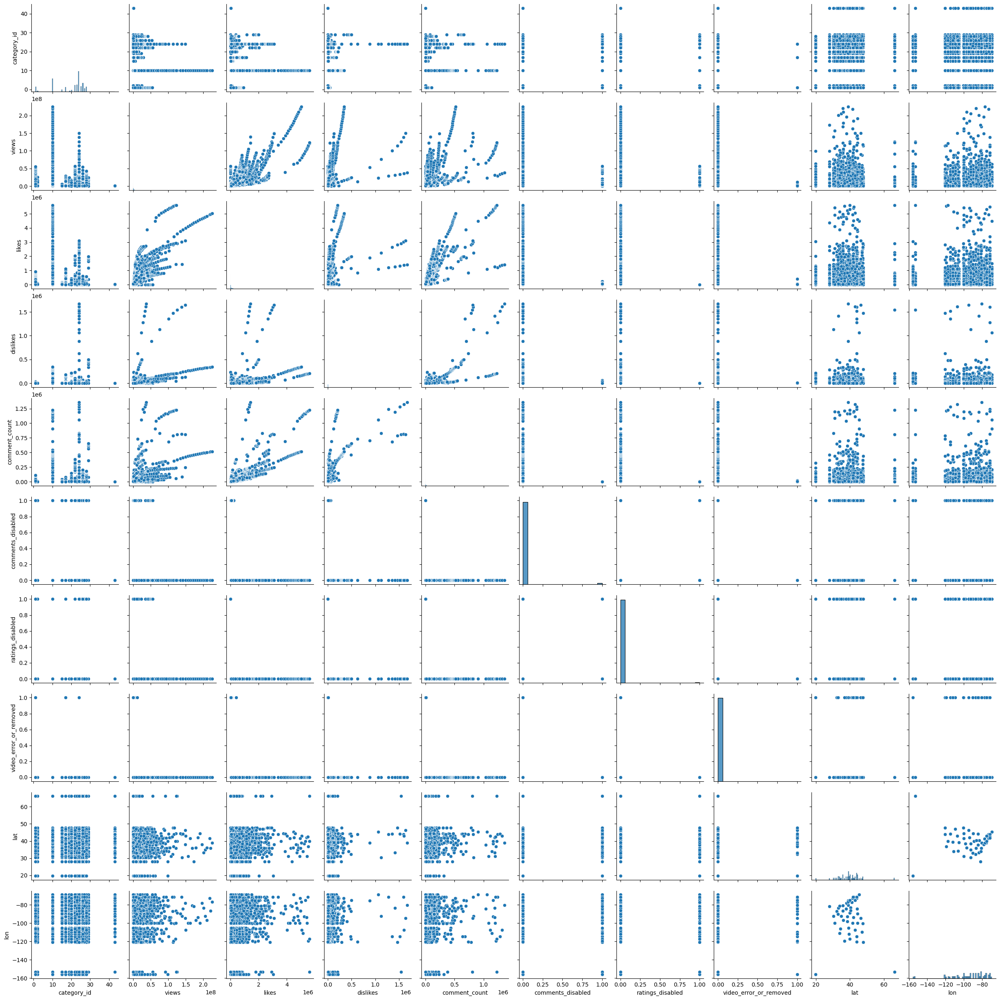

In [6]:
sns.pairplot(df_videos)

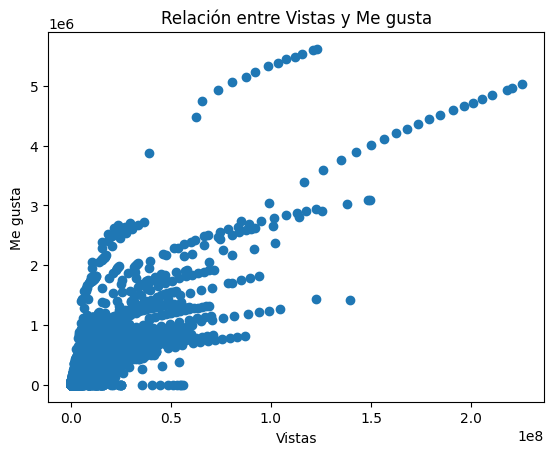

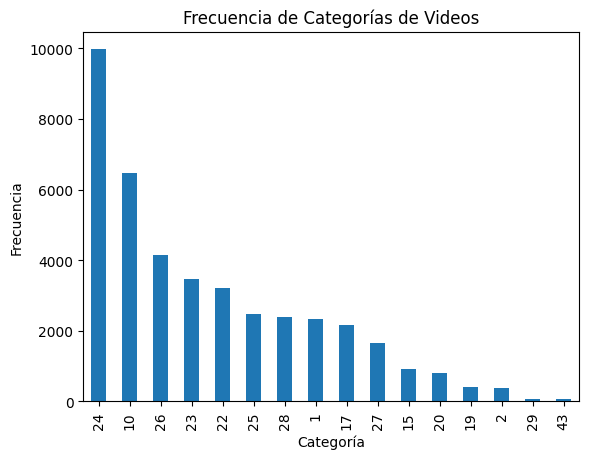

In [7]:
# Visualización de la relación entre vistas y me gusta
plt.scatter(df_videos['views'], df_videos['likes'])
plt.xlabel('Vistas')
plt.ylabel('Me gusta')
plt.title('Relación entre Vistas y Me gusta')
plt.show()

# Visualización de categorías de videos
df_videos['category_id'].value_counts().plot(kind='bar')
plt.title('Frecuencia de Categorías de Videos')
plt.xlabel('Categoría')
plt.ylabel('Frecuencia')
plt.show()

## 2. Verificar la calidad de los datos
Para verificar nulos y valores atípicos

In [4]:
# Verificar nulos
print(df_videos.isnull().sum())

video_id                    0
trending_date               0
title                       0
channel_title               0
category_id                 0
publish_time                0
tags                        0
views                       0
likes                       0
dislikes                    0
comment_count               0
thumbnail_link              0
comments_disabled           0
ratings_disabled            0
video_error_or_removed      0
description               570
state                       0
lat                         0
lon                         0
geometry                    0
dtype: int64


In [5]:
# Verificar valores atípicos en 'views' y 'likes'
outliers = df_videos[(df_videos['views'] > 1e7) | (df_videos['likes'] > 1e6)]
print(outliers)

          video_id trending_date  \
32     n1WpP7iowLc      17.14.11   
70     2Vv-BfVoq4g      17.14.11   
298    n1WpP7iowLc      17.15.11   
310    9t9u_yPEidY      17.15.11   
336    2Vv-BfVoq4g      17.15.11   
...            ...           ...   
40920  3Q2j5ApzSqs      18.14.06   
40925  QgOXIEhHU1Y      18.14.06   
40938  n_W54baizX8      18.14.06   
40942  ju_inUnrLc4      18.14.06   
40948  ooyjaVdt-jA      18.14.06   

                                                   title      channel_title  \
32            Eminem - Walk On Water (Audio) ft. Beyoncé         EminemVEVO   
70           Ed Sheeran - Perfect (Official Music Video)         Ed Sheeran   
298           Eminem - Walk On Water (Audio) ft. Beyoncé         EminemVEVO   
310    Jennifer Lopez - Amor, Amor, Amor (Official Vi...  JenniferLopezVEVO   
336          Ed Sheeran - Perfect (Official Music Video)         Ed Sheeran   
...                                                  ...                ...   
40920  Christi

## 3. Preparación de los Datos

### 3.1. Limpiar los datos

In [6]:
# Eliminar filas con valores nulos
data_clean = df_videos.dropna()

In [7]:
#Como vimos previamente la columna "description" tiene valores nulo
null_description = df_videos[df_videos['description'].isnull()]
print(null_description)

          video_id trending_date  \
42     NZFhMSgbKKM      17.14.11   
47     sbcbvuitiTc      17.14.11   
175    4d07RXYLsJE      17.14.11   
267    NZFhMSgbKKM      17.15.11   
312    sbcbvuitiTc      17.15.11   
...            ...           ...   
40125  1h7KV2sjUWY      18.10.06   
40325  1h7KV2sjUWY      18.11.06   
40538  1h7KV2sjUWY      18.12.06   
40739  1h7KV2sjUWY      18.13.06   
40945  1h7KV2sjUWY      18.14.06   

                                                   title  \
42     Dennis Smith Jr. and LeBron James go back and ...   
47     Stephon Marbury and Jimmer Fredette fight in C...   
175                  Sphaera - demonstrating interaction   
267    Dennis Smith Jr. and LeBron James go back and ...   
312    Stephon Marbury and Jimmer Fredette fight in C...   
...                                                  ...   
40125                         True Facts : Ant Mutualism   
40325                         True Facts : Ant Mutualism   
40538                      

In [8]:
# Completar valores nulos en "description" con un string vacío
df_videos['description'].fillna('', inplace=True)

In [9]:
df_videos.isnull().sum()

video_id                  0
trending_date             0
title                     0
channel_title             0
category_id               0
publish_time              0
tags                      0
views                     0
likes                     0
dislikes                  0
comment_count             0
thumbnail_link            0
comments_disabled         0
ratings_disabled          0
video_error_or_removed    0
description               0
state                     0
lat                       0
lon                       0
geometry                  0
dtype: int64

### 3.2. Pre-procesar los Datos


In [10]:
# Identificar y tratar outliers
def replace_invalid_and_outliers(column):
    median = column.median()
    std_dev = column.std()
    lower_bound = median - 3 * std_dev
    upper_bound = median + 3 * std_dev
    column = column.apply(lambda x: median if x < lower_bound or x > upper_bound else x)
    return column   

df_videos['views'] = replace_invalid_and_outliers(df_videos['views'])
df_videos['likes'] = replace_invalid_and_outliers(df_videos['likes'])
df_videos['dislikes'] = replace_invalid_and_outliers(df_videos['dislikes'])
df_videos['comment_count'] = replace_invalid_and_outliers(df_videos['comment_count'])

df_videos['views'] = df_videos['views'].replace(0, df_videos['views'].mean())
df_videos['likes'] = df_videos['likes'].replace(0, df_videos['likes'].mean())
df_videos['dislikes'] = df_videos['dislikes'].replace(0, df_videos['dislikes'].mean())
df_videos['comment_count'] = df_videos['comment_count'].replace(0, df_videos['comment_count'].mean())

### 3.3. Construir Nuevos Datos

In [ ]:
#Si es necesario, se puede crear nuevas columnas derivadas de las existentes.

## 4. Requerimientos

### Resolucion de las preguntas

### Por Categoría de Videos

1. ¿Qué categorías de videos son las de mayor tendencia?

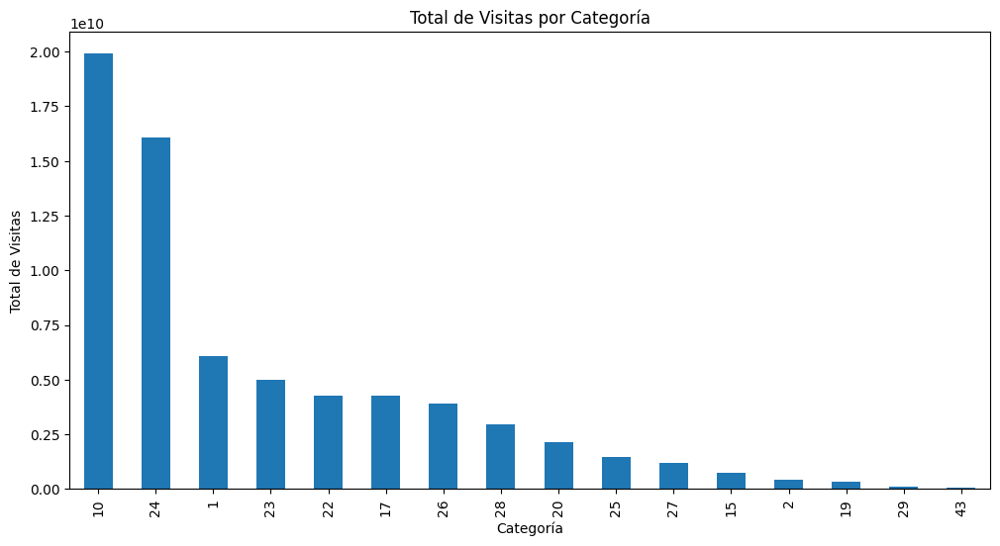

In [18]:
# 1. Total de visitas por categoría
total_views_by_category = df_videos.groupby('category_id')['views'].sum().sort_values(ascending=False)
total_views_by_category.plot(kind='bar', figsize=(12, 6))
plt.title('Total de Visitas por Categoría')
plt.xlabel('Categoría')
plt.ylabel('Total de Visitas')
plt.xticks(rotation=90)
plt.show()

2. ¿Qué categorías de videos son los que más gustan? ¿Y las que menos gustan?

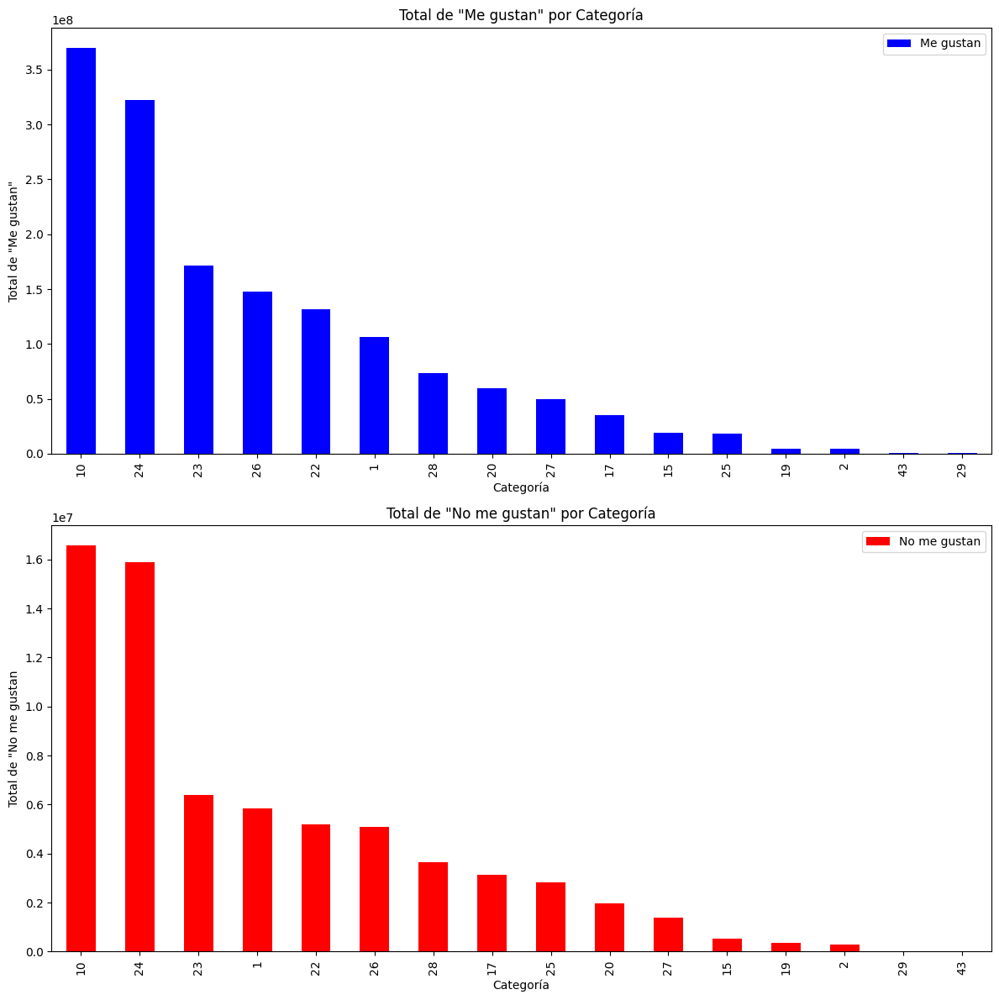

In [44]:
# 2. Total de 'Me gustan' y 'No me gustan' por categoría
total_likes_by_category = df_videos.groupby('category_id')['likes'].sum().sort_values(ascending=False)
total_dislikes_by_category = df_videos.groupby('category_id')['dislikes'].sum().sort_values(ascending=False)

fig, axes = plt.subplots(2, 1, figsize=(12, 12))
total_likes_by_category.plot(kind='bar', ax=axes[0], color='b', label='Me gustan')
total_dislikes_by_category.plot(kind='bar', ax=axes[1], color='r', label='No me gustan')

axes[0].set_title('Total de "Me gustan" por Categoría')
axes[0].set_xlabel('Categoría')
axes[0].set_ylabel('Total de "Me gustan"')

axes[1].set_title('Total de "No me gustan" por Categoría')
axes[1].set_xlabel('Categoría')
axes[1].set_ylabel('Total de "No me gustan')

axes[0].legend()
axes[1].legend()

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

3. ¿Qué categorías de videos tienen la mejor proporción (ratio) de “Me gusta” / “No me gusta”?

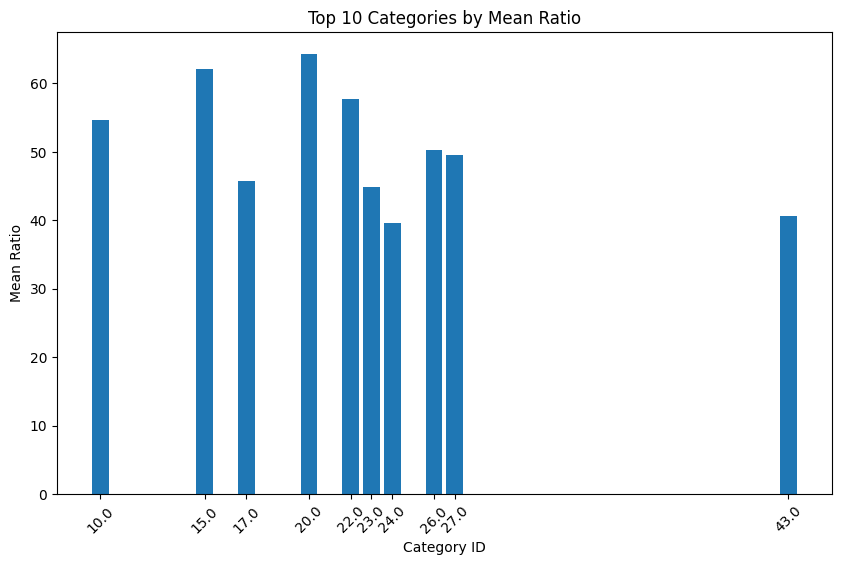

In [45]:
# 3. Categorías con la mejor proporción de "Me gusta" / "No me gusta"
df_videos['likes_to_dislikes_ratio'] = df_videos['likes'] / df_videos['dislikes']

category_by_ratio_mean = pd.DataFrame({
    "category_id": [10000],
    "ratio_mean": [0.0],
    "nVideos": [1]
})

for index, row in df_videos.iterrows():
    #print(category_by_ratio_mean)
    if len(category_by_ratio_mean[category_by_ratio_mean['category_id'] == row['category_id'] ].values) == 0:
        xd = {'category_id': row['category_id'], 'ratio_mean': row['likes_to_dislikes_ratio'], 'nVideos': 1}
        category_by_ratio_mean.loc[len(category_by_ratio_mean)] = [row['category_id'], row['likes_to_dislikes_ratio'], 1]
    else:
        ratio_mean = (category_by_ratio_mean.loc[category_by_ratio_mean['category_id'] == row['category_id']]['ratio_mean'])
        nValues = (category_by_ratio_mean.loc[category_by_ratio_mean['category_id'] == row['category_id']]['nVideos'])
        newMean = (ratio_mean/((nValues+1)/nValues) + (row['likes_to_dislikes_ratio']/(nValues+1)))
        #print(ratio_mean)
        #print(nValues)
        #print(newMean+0.0, end= '\n\n')
        category_by_ratio_mean.loc[category_by_ratio_mean.index[category_by_ratio_mean['category_id'] == row['category_id']],'ratio_mean'] = newMean
        category_by_ratio_mean.loc[category_by_ratio_mean.index[category_by_ratio_mean['category_id'] == row['category_id']],'nVideos'] = nValues+1
    #print(category_by_ratio_mean)

top_10_categories = category_by_ratio_mean.sort_values(by='ratio_mean', ascending=False).head(10)
plt.figure(figsize=(10, 6))
plt.bar(top_10_categories['category_id'], top_10_categories['ratio_mean'], tick_label=top_10_categories['category_id'])
plt.xlabel('Category ID')
plt.ylabel('Mean Ratio')
plt.title('Top 10 Categories by Mean Ratio')
plt.xticks(rotation=45)

plt.show()

4. ¿Qué categorías de videos tienen la mejor proporción (ratio) de “Vistas” / “Comentarios”?

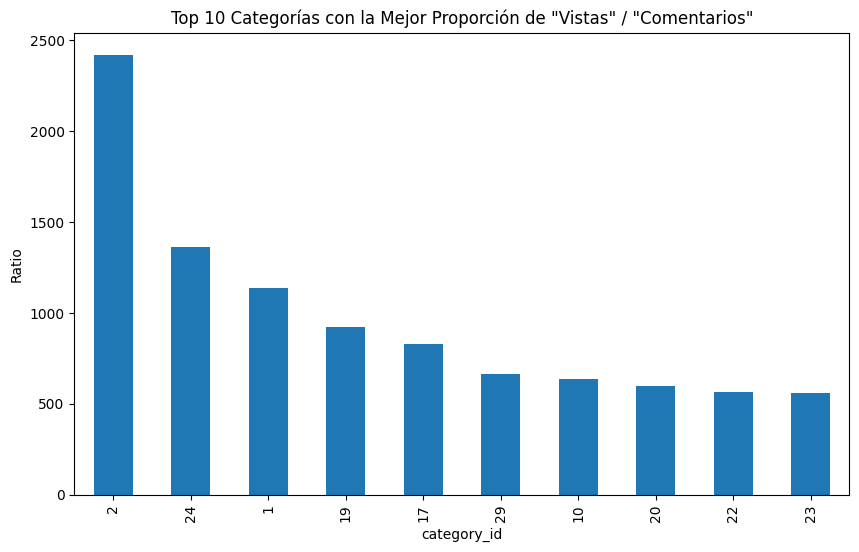

In [46]:
# 4. Categorías con la mejor proporción de "Vistas" / "Comentarios"
df_videos['views_to_comments_ratio'] = df_videos['views'] / df_videos['comment_count']
top_10_views_to_comments_ratio = df_videos.groupby('category_id')['views_to_comments_ratio'].mean().nlargest(10)
top_10_views_to_comments_ratio.plot(kind='bar', figsize=(10, 6))
plt.title('Top 10 Categorías con la Mejor Proporción de "Vistas" / "Comentarios"')
plt.ylabel('Ratio')
plt.xticks(rotation=90)
plt.show()

### Por el tiempo transcurrido

5. ¿Cómo ha cambiado el volumen de los videos en tendencia a lo largo del tiempo?

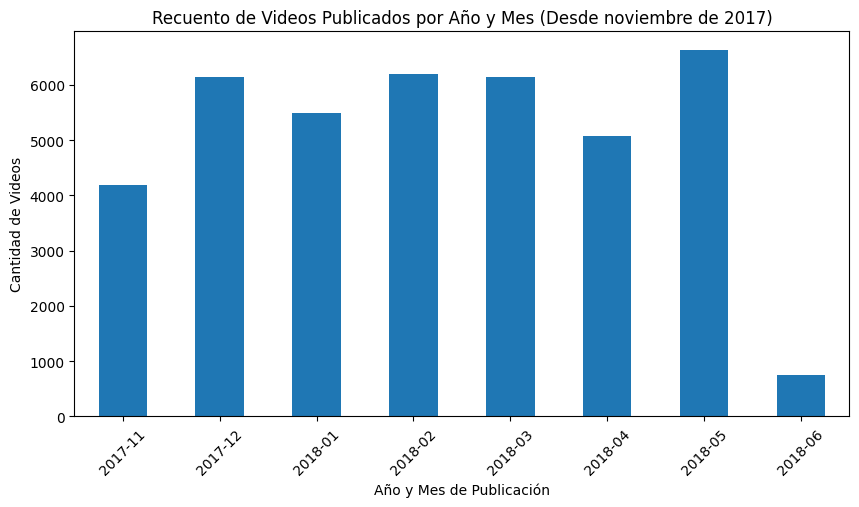

In [15]:
#5. ¿Cómo ha cambiado el volumen de los videos en tendencia a lo largo del tiempo?
df_videos['publish_time'] = pd.to_datetime(df_videos['publish_time'])
df_videos['año_mes'] = df_videos['publish_time'].dt.strftime('%Y-%m')

df_filtrado = df_videos[df_videos['año_mes'] >= '2017-11']
año_mes = df_filtrado.groupby('año_mes').size().sort_index()

plt.figure(figsize=(10, 5))
año_mes.plot(kind='bar')
plt.title('Recuento de Videos Publicados por Año y Mes (Desde noviembre de 2017)')
plt.xlabel('Año y Mes de Publicación')
plt.ylabel('Cantidad de Videos')
plt.xticks(rotation=45)
plt.show()

### Por Canales de YouTube

6. ¿Qué Canales de YouTube son tendencia más frecuentemente? ¿Y cuáles con menos frecuencia?

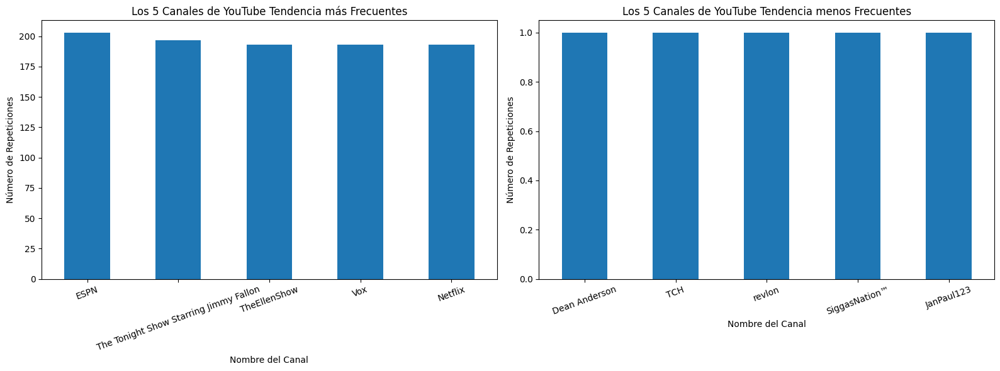

In [16]:
#6. ¿Qué Canales de YouTube son tendencia más frecuentemente? ¿Y cuáles con menos frecuencia?

canales_frec = df_videos['channel_title'].value_counts().sort_values(ascending=False)
mas_frec = canales_frec.head(5)
menos_frec = canales_frec.tail(5)

plt.figure(figsize=(16, 6))

plt.subplot(1, 2, 1)
mas_frec.plot(kind='bar')
plt.title('Los 5 Canales de YouTube Tendencia más Frecuentes')
plt.xlabel('Nombre del Canal')
plt.ylabel('Número de Repeticiones')
plt.xticks(rotation=20)

plt.subplot(1, 2, 2)
menos_frec.plot(kind='bar')
plt.title('Los 5 Canales de YouTube Tendencia menos Frecuentes')
plt.xlabel('Nombre del Canal')
plt.ylabel('Número de Repeticiones')
plt.xticks(rotation=20) 

plt.tight_layout()
plt.show()

### Por la geografía del país

7. ¿En qué Estados se presenta el mayor número de “Vistas”, “Me gusta” y “No me gusta”? 

In [18]:
df_videos.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,state,lat,lon,geometry
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374.0,57527.0,2966.0,15954.0,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,Utah,39.419220,-111.950684,POINT (-111.950684 39.41922)
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783.0,97185.0,6146.0,12703.0,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",Nevada,39.876019,-117.224121,POINT (-117.224121 39.876019)
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434.0,146033.0,5339.0,8181.0,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Delaware,39.000000,-75.500000,POINT (-75.5 39)
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168.0,10172.0,666.0,2146.0,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,Delaware,39.000000,-75.500000,POINT (-75.5 39)
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731.0,132235.0,1989.0,17518.0,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Michigan,44.182205,-84.506836,POINT (-84.50683600000001 44.182205)


In [16]:
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode

# Inicializar el modo notebook para visualización en Jupyter Notebook
init_notebook_mode(connected=True)

# Crear el scatter plot
scatter = go.Scattergeo(
    lon=df_videos['lon'],
    lat=df_videos['lat'],
    text=df_videos.apply(lambda row: f"{row['state']}<br>Lat: {row['lat']}<br>Lon: {row['lon']}<br>Vistas: {row['views']}", axis=1),
    marker=dict(
        size=df_videos['views'] / 100000,  # Ajusta el tamaño del marcador según las vistas
        color=df_videos['views'],  # Puedes cambiar esto a 'likes' o 'dislikes'
        colorscale='Viridis',  # Puedes cambiar la escala de colores según tus preferencias
        colorbar=dict(title='Vistas')
    )
)

# Definir el diseño del mapa
layout = dict(
    geo=dict(
        scope='world',  # Puedes cambiar esto a 'usa' si deseas limitarlo a Estados Unidos
        showland=True,
    )
)

# Crear la figura
fig = go.Figure(data=[scatter], layout=layout)

# Mostrar el scatter plot interactivo
iplot(fig)


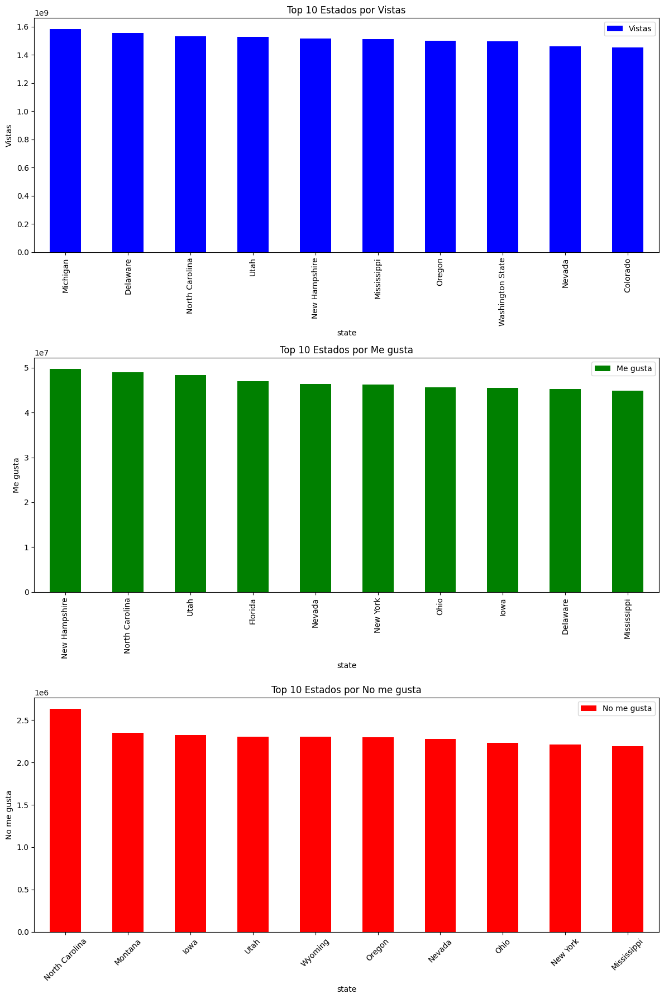

In [19]:
# Conteo de vistas, me gusta y no me gusta por estado
views_by_state = df_videos.groupby('state')['views'].sum().nlargest(10)
likes_by_state = df_videos.groupby('state')['likes'].sum().nlargest(10)
dislikes_by_state = df_videos.groupby('state')['dislikes'].sum().nlargest(10)

# Gráficos por estado
fig, axes = plt.subplots(3, 1, figsize=(12, 18))
views_by_state.plot(kind='bar', ax=axes[0], color='b', label='Vistas')
likes_by_state.plot(kind='bar', ax=axes[1], color='g', label='Me gusta')
dislikes_by_state.plot(kind='bar', ax=axes[2], color='r', label='No me gusta')

axes[0].set_title('Top 10 Estados por Vistas')
axes[0].set_ylabel('Vistas')

axes[1].set_title('Top 10 Estados por Me gusta')
axes[1].set_ylabel('Me gusta')

axes[2].set_title('Top 10 Estados por No me gusta')
axes[2].set_ylabel('No me gusta')

axes[0].legend()
axes[1].legend()
axes[2].legend()

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Adicionalmente, al cliente le gustaría conocer si:

8. ¿Es factible predecir el número de “Vistas” o “Me gusta” o “No me gusta”?

Comenzamos la prueba con Vistas

In [122]:
# X será la columna de categorías, y serán las métricas que quieres predecir (likes, dislikes, vistas), en este caso solo las vistas(y)
X = df_videos[['dislikes','likes','comment_count']]
y = df_videos['views']

# División de los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creación del modelo y entrenamiento
model = LinearRegression()
model.fit(X_train, y_train)

# visualicemos la intersección -> intercept -> w0 = valor de y cuando x es nulo

slope = model.coef_  # w1
intercept = model.intercept_ # w0

print("Las pendientes 'w1' del modelo son: ", slope)
print("El término independiente de la recta 'w0' es: ", intercept)

Las pendientes 'w1' del modelo son:  [91.19882018 17.68345585 19.13676432]
El término independiente de la recta 'w0' es:  425556.9360152241


In [123]:
# Creamos un nuevo dataframe teniendo una unica columna llamada coeficiente obtenido para cada variable o atributo evaluado en 
# el modelo
# El coeficiente calculado es W1 -> Cuánto crece "y" cuando "x" sufre un cambio.
coef_df = pd.DataFrame(model.coef_,X.columns,columns=['Coeficiente'])
coef_df

,Coeficiente
dislikes,91.198820
likes,17.683456
comment_count,19.136764


In [124]:
# Predicción
predictions = model.predict(X_test)

Text(0, 0.5, 'Y Predichos')

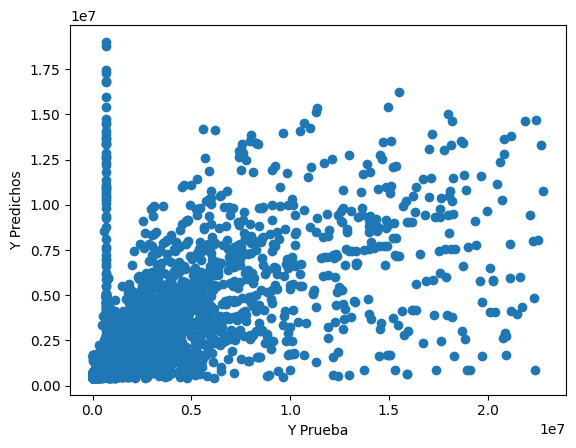

In [125]:
plt.scatter(y_test,predictions)
plt.xlabel('Y Prueba')
plt.ylabel('Y Predichos')

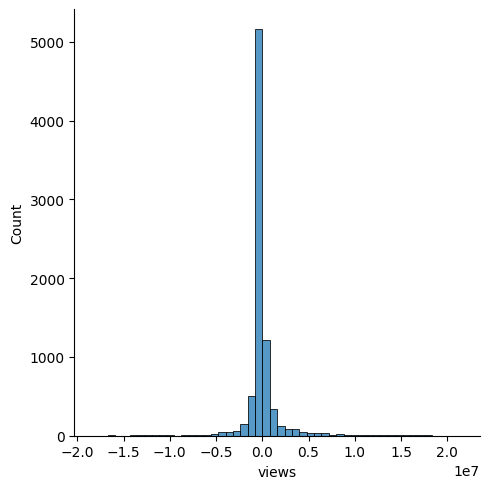

In [126]:
sns.displot((y_test-predictions),bins=50);

In [127]:
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 974386.1038301219
MSE: 4691182556081.517
RMSE: 2165913.7923937594


Prueba con "Me gusta"

Las pendientes 'w1' del modelo son:  [-0.14695584  0.01504755  3.202784  ]
El término independiente de la recta 'w0' es:  7824.51921771263
MAE: 28885.07613354612
MSE: 4005980530.2409825
RMSE: 63292.81578695154


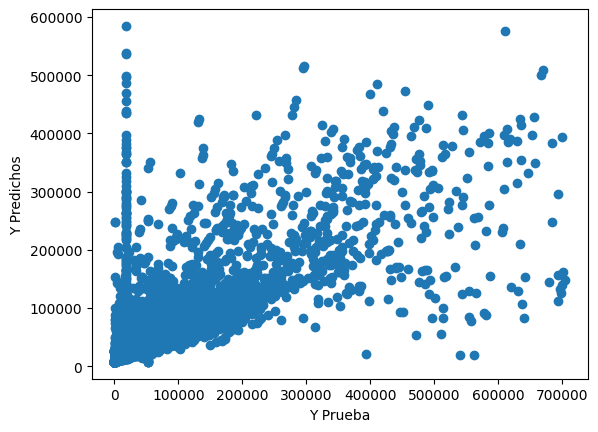

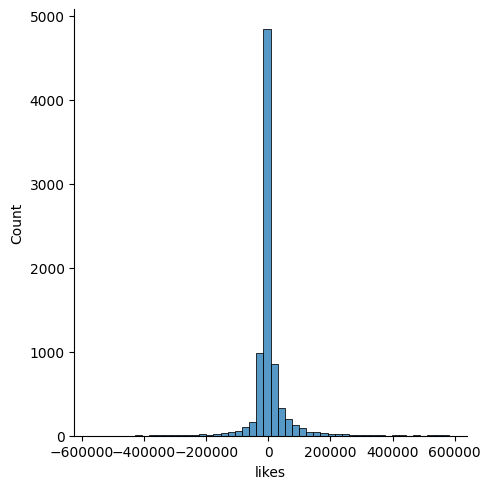

In [128]:
# X será la columna de categorías, y serán las métricas que quieres predecir (likes, dislikes, vistas), en este caso solo las vistas(y)
X = df_videos[['dislikes','views','comment_count']]
y = df_videos['likes']

# División de los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creación del modelo y entrenamiento
model = LinearRegression()
model.fit(X_train, y_train)

# visualicemos la intersección -> intercept -> w0 = valor de y cuando x es nulo

slope = model.coef_  # w1
intercept = model.intercept_ # w0

print("Las pendientes 'w1' del modelo son: ", slope)
print("El término independiente de la recta 'w0' es: ", intercept)

# Creamos un nuevo dataframe teniendo una unica columna llamada coeficiente obtenido para cada variable o atributo evaluado en 
# el modelo
# El coeficiente calculado es W1 -> Cuánto crece "y" cuando "x" sufre un cambio.
coef_df = pd.DataFrame(model.coef_,X.columns,columns=['Coeficiente'])
coef_df

# Predicción
predictions = model.predict(X_test)

plt.scatter(y_test,predictions)
plt.xlabel('Y Prueba')
plt.ylabel('Y Predichos')

sns.displot((y_test-predictions),bins=50);

print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

Prueba con "No me gusta"

Las pendientes 'w1' del modelo son:  [-0.00103283  0.00054542  0.22715194]
El término independiente de la recta 'w0' es:  272.8105109664043
MAE: 1774.4408115938934
MSE: 25554158.26213868
RMSE: 5055.112091946002


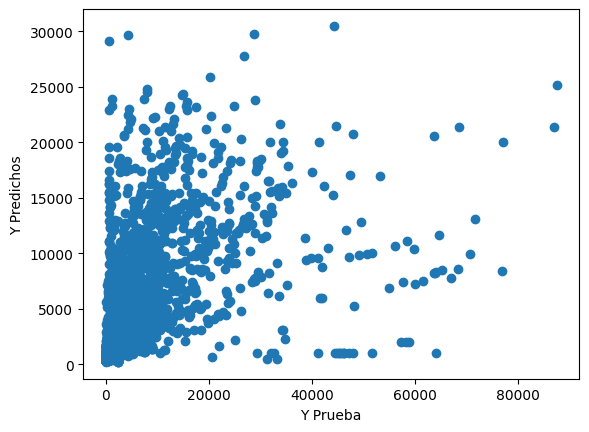

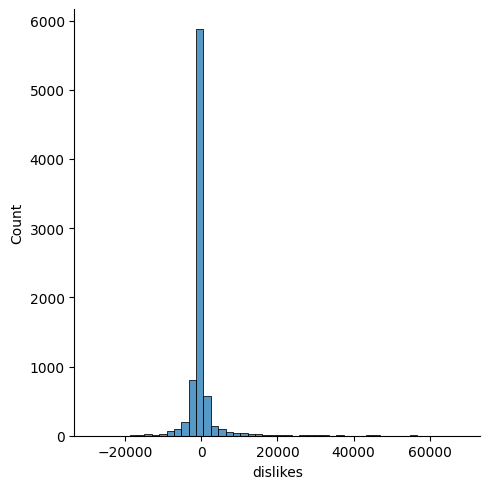

In [129]:
# X será la columna de categorías, y serán las métricas que quieres predecir (likes, dislikes, vistas), en este caso solo las vistas(y)
X = df_videos[['likes','views','comment_count']]
y = df_videos['dislikes']

# División de los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creación del modelo y entrenamiento
model = LinearRegression()
model.fit(X_train, y_train)

# visualicemos la intersección -> intercept -> w0 = valor de y cuando x es nulo

slope = model.coef_  # w1
intercept = model.intercept_ # w0

print("Las pendientes 'w1' del modelo son: ", slope)
print("El término independiente de la recta 'w0' es: ", intercept)

# Creamos un nuevo dataframe teniendo una unica columna llamada coeficiente obtenido para cada variable o atributo evaluado en 
# el modelo
# El coeficiente calculado es W1 -> Cuánto crece "y" cuando "x" sufre un cambio.
coef_df = pd.DataFrame(model.coef_,X.columns,columns=['Coeficiente'])
coef_df

# Predicción
predictions = model.predict(X_test)

plt.scatter(y_test,predictions)
plt.xlabel('Y Prueba')
plt.ylabel('Y Predichos')

sns.displot((y_test-predictions),bins=50);

print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

Luego de realizar el modelo de regresión para la predicción de cada una de las tres variables, se logró obtener el resultado de error de cada uno, siendo el más factible el menor de estos, que fue el de "No me gusta". Entonces es factible predecir el número de los "No me gusta" de los videos.

9. ¿Los videos en tendencia son los que mayor cantidad de comentarios positivos reciben?

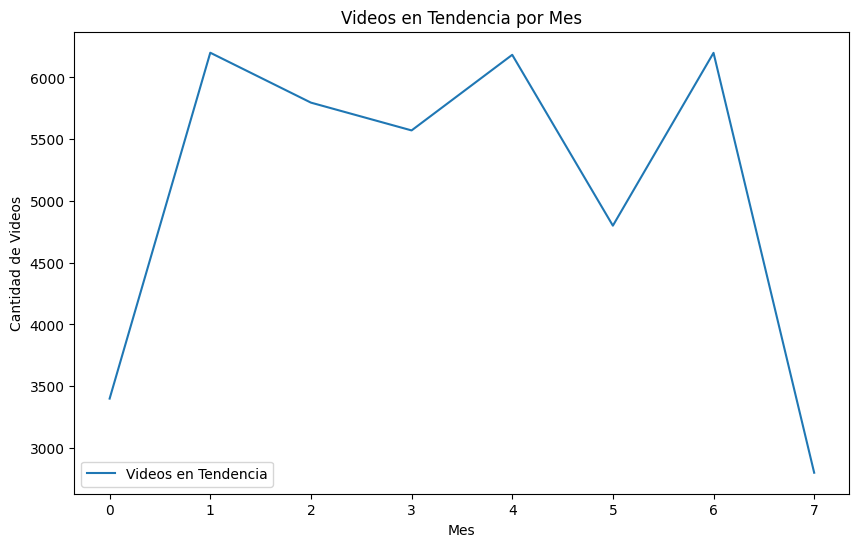

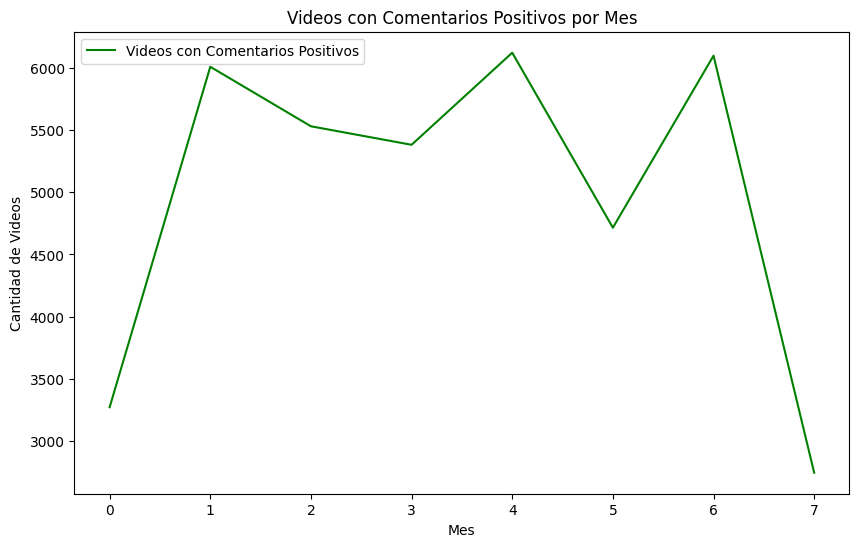

In [31]:
# Agrupar por meses y contar videos en tendencia
trend_by_month = df_videos.groupby([df_videos['trending_date'].dt.year.rename('Year'), df_videos['trending_date'].dt.month.rename('Month')])['video_id'].count().reset_index()

# Filtrar y contar los videos con comentarios positivos por mes
positive_by_month = df_videos[df_videos['likes'] > df_videos['dislikes']].groupby([df_videos['trending_date'].dt.year.rename('Year'), df_videos['trending_date'].dt.month.rename('Month')])['video_id'].count().reset_index()

# Renombrar columnas
trend_by_month.columns = ['Year', 'Month', 'Videos_In_Trend']
positive_by_month.columns = ['Year', 'Month', 'Positive_Comments']

# Combinar ambos conjuntos de datos en función del año y mes
monthly_stats = trend_by_month.merge(positive_by_month, on=['Year', 'Month'], how='outer').fillna(0)

# Graficar la cantidad de videos en tendencia por mes
plt.figure(figsize=(10, 6))
plt.plot(monthly_stats['Videos_In_Trend'], label='Videos en Tendencia')
plt.xlabel('Mes')
plt.ylabel('Cantidad de Videos')
plt.title('Videos en Tendencia por Mes')
plt.legend()
plt.show()

# Graficar la cantidad de videos con comentarios positivos por mes
plt.figure(figsize=(10, 6))
plt.plot(monthly_stats['Positive_Comments'], label='Videos con Comentarios Positivos', color='green')
plt.xlabel('Mes')
plt.ylabel('Cantidad de Videos')
plt.title('Videos con Comentarios Positivos por Mes')
plt.legend()
plt.show()
